In [1]:
#### Notebook: code_usage_examples.ipynb
#### Examples of using the code in the accompanying python code files: extreme_temp_identification.py, extreme_temp_utils.py, regions.py

## Objectives

The objectives of this notebook is to demonstrate examples of using the code in this section of the project to:
1) Identify extreme temperature events
    - Process the already available CMIP data netcdf files from different simulation models, to identify extreme temperature events like heatwaves
         - consider different criteria for identifying heatwaves
    - Make available the results in xarray format and store, again, as netcdf files.
    - Optionally, store results in Azure Storage for effective reuse.
    - Visualize and analyze the results
2) Prepare for machine learning
    - Generate images to be used in machine learning

## Getting Ready

Following the examples of this notebook, any new notebook can be created to implement your own use cases.

For the code to work, the following *three* files should also be in the same location as your notebook (ipynb) file:
 - regions.py
 - extreme_temp_utils.py
 - extreme_temp_identification.py
 
**As the first step, run the following two code blocks that 'run' the two python code files. The third python code file gets run implicitly.**

In [8]:
%run extreme_temp_identification.py

In [9]:
%run regions.py

Other imports:

In [48]:
%matplotlib inline
import matplotlib.pyplot as plt

# cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature

### Note:
If you encounter **errors** for missing libraries / packages then, based on the error, consider uncommenting the applicable following code blocks and execute. These are required to be run once in an environment. From the next time onwards, you may not need to run these following installation steps again if the underlying environment remains the same.

In [ ]:
#### interactive plots hvplot  ---- uncomment and run the following:
# !conda install -c pyviz hvplot -y

## Regions and Areas of Interest

We start by exploring the concept of regions and areas-of-interest implemented in the code. 

### Region (North America)
The result from identifying extreme temperature events can be large. For a more manageable size of the results, we work with a specific area at a time. To help select standardized areas, the implements pre-defined regions. It is intended to have 6 to 8 main regions for the whole planet. As of now, only one region (region_id = 1), 'North America' has been implemented. In future, more regions can easily be added as required.

Here is the code to see the details of the implemented region:

In [4]:
reg = Regions()
reg.get_all_regions()

{1: {'region_id': 1,
  'region_name': 'North America',
  'top_lat': 84,
  'bottom_lat': 14,
  'left_lon': 190,
  'right_lon': 350,
  'may_to_oct_range': (200, 335),
  'img_url': 'https://nasanex30analysis.blob.core.windows.net/cmip6/images/Region_North_America.png'}}

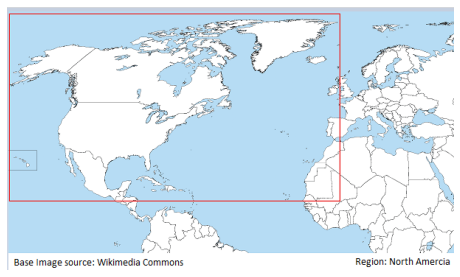

Region: 1 - North America, top_lat: 84, bottom_lat: 14, left_lon: 190, right_lon: 350


In [8]:
reg.show_region_by_ID(1)

### Areas of Interest (within region North America)

While the region is a good subset to work with, but for specific focus, the user may want to work with a more limited area as 'area-of-interest.

For this purpose, a few subset areas are implemented as Areas-of-interest. Here is the code to get a list of all areas-of-interest within the region 1.

In [9]:
reg.get_all_areas_of_interest_by_region_ID(1)

[{'aoi_id': 100,
  'area_of_interest': 'Mainland United States',
  'region_id': 1,
  'region_name': 'North America',
  'top_lat': 49,
  'bottom_lat': 25,
  'left_lon': 235,
  'right_lon': 293,
  'may_to_oct_range': (210, 335),
  'img_url': 'https://nasanex30analysis.blob.core.windows.net/cmip6/images/AoI_Mainland_US.png'},
 {'aoi_id': 101,
  'area_of_interest': 'Upper Northeast US',
  'region_id': 1,
  'region_name': 'North America',
  'top_lat': 46,
  'bottom_lat': 39,
  'left_lon': 280,
  'right_lon': 293,
  'may_to_oct_range': (210, 335),
  'img_url': 'https://nasanex30analysis.blob.core.windows.net/cmip6/images/AoI_Upper_Northeast_US.png'},
 {'aoi_id': 102,
  'area_of_interest': 'Lower Northeast US',
  'region_id': 1,
  'region_name': 'North America',
  'top_lat': 39,
  'bottom_lat': 37,
  'left_lon': 271,
  'right_lon': 286,
  'may_to_oct_range': (210, 335),
  'img_url': 'https://nasanex30analysis.blob.core.windows.net/cmip6/images/AoI_Lower_Northeast_US.png'},
 {'aoi_id': 103,
  

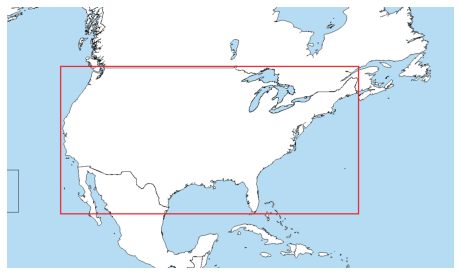

Area of Interest: 100 - Mainland United States, top_lat: 49, bottom_lat: 25, left_lon: 235, right_lon: 293


In [10]:
# visualize area of interest with ID 100 (Mainland United States)
reg.show_areas_of_interest_by_aoi_ID(100)

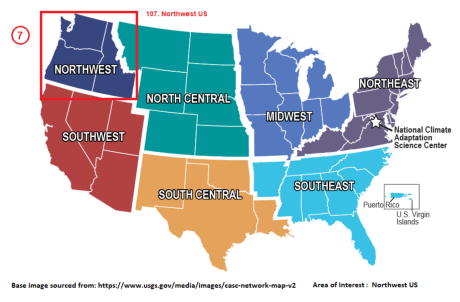

Area of Interest: 107 - Northwest US, top_lat: 49, bottom_lat: 42, left_lon: 235, right_lon: 249


In [11]:
# visualize area of interest with ID 107 (Northwest US)
reg.show_areas_of_interest_by_aoi_ID(107)

## Create Average Temperature file

One criteria of identifying extreme temperature events (heat waves) is to consider above average temperature. 

For this purpose, often a 30-year or a 50-year period is used as the duration from which to calculate average. 

The function **Interactive_GetAverageForRange()** code provides the complete functionality to generate such averages along with the record temperature, captured for each day in the underlying CMIP dataset.

### Create Average Temperature file -- locally, no azure; maximum temperature

In [4]:
start_year = 1950
end_year = 1969

# without Azure so make those parameters None
# averages file in azure
use_sas_token = None
use_azure_url = None

# cmip files - raw data from NASA site
name_prefix = 'tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_'               # without the year at the end

# url_prefix: remeber to update to tasmax or tasmin; provide without the filename
cmip_files_url = 'https://ds.nccs.nasa.gov/thredds2/fileServer/AMES/NEX/GDDP-CMIP6/GISS-E2-1-G/historical/r1i1p1f2/tasmax/'

model_name = 'GISS_E2_1_G'  # with underscores, without _historical at the end

avg_ds = Interactive_GetAverageForRange(start_year, end_year, cmip=6, result_type='max'
                           , model_name = model_name,azure_url_prefix=use_azure_url, sas_token=use_sas_token
                           , cmip_files_url=cmip_files_url, cmip_file_name_prefix=name_prefix, from_azure=False
                           , save_back_in_azure=False, interactive=True)
avg_ds

Get Average and Record max temperature for the range 1950 to 1969, for CMIP6, model GISS_E2_1_G


Do you want to continue? y/n y


01:07:06 UTC: Get Averages file Avg_temp_max_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc
01:07:06 UTC: Available locally? No. Checking in Azure...
01:07:06 UTC: Azure url not provided, could not check there. Now preparing...
01:07:06 UTC: Arranging for all the component (10-year) files(s)
prepare_component_averages_files: filename:  Avg_temp_max_CMIP6_GISS_E2_1_G__10_yrs__1950_to_1959.nc
01:07:06 UTC: Component file 1 of 2 : --- 1950 to 1959 ----------
01:07:06 UTC: Component file available locally? No. Checking in Azure...
01:07:06 UTC: Component file also not in Azure, preparing...
1950
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1950.nc
1951
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1951.nc
1952
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1952.nc
1953
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1953.nc
1954
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1954.nc
1955
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1955.nc
1956
tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1956.

<xarray.Dataset>
Dimensions:    (lat: 600, lon: 1440, day: 365)
Coordinates:
  * lat        (lat) float64 -59.88 -59.62 -59.38 -59.12 ... 89.38 89.62 89.88
  * lon        (lon) float64 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
  * day        (day) int64 1 2 3 4 5 6 7 8 9 ... 358 359 360 361 362 363 364 365
Data variables:
    tasmaxavg  (day, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    tasmaxrec  (day, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    Dataset:           Average temperature CMIP6
    About dataset:     A dataset with average and record temparatures, across...
    Original values:   tasmax
    Data variables:    ['tasmaxavg', 'tasmaxrec']
    Data description:  Average and record maximum temperature, based on tasmax
    Range:             20 years
    Start year:        1950
    End year:          1969
    Years processed:   20
    Store as:          Avg_temp_max_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc

### Create Average Temperature file -- with azure; minimum temperature
NOTE: result_type paramater passed = 'min', and other changes (filename, url etc.)  
NOTE: also, using this time -- azure url and SAS token; save_back_in_azure=True

In [5]:
start_year = 1950
end_year = 1969

# without Azure so make those parameters None
# averages file in azure
use_sas_token = '<paste your sas token here, within quotes>'
# Provide azure url with underscores
use_azure_url = 'https://nasanex30analysis.blob.core.windows.net/cmip6/averages/GISS_E2_1_G/'  # GFDL_ESM4 or GISS_E2_1_G etc.


# cmip files - raw data from NASA site
name_prefix = 'tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_'               # without the year at the end

# url_prefix: remeber to update to tasmax or tasmin; provide without the filename
cmip_files_url = 'https://ds.nccs.nasa.gov/thredds2/fileServer/AMES/NEX/GDDP-CMIP6/GISS-E2-1-G/historical/r1i1p1f2/tasmin/'

model_name = 'GISS_E2_1_G'  # with underscores, without _historical at the end

avg_ds = Interactive_GetAverageForRange(start_year, end_year, cmip=6, result_type='min'
                           , model_name = model_name,azure_url_prefix=use_azure_url, sas_token=use_sas_token
                           , cmip_files_url=cmip_files_url, cmip_file_name_prefix=name_prefix, from_azure=False
                           , save_back_in_azure=True, interactive=True)
avg_ds

Get Average and Record min temperature for the range 1950 to 1969, for CMIP6, model GISS_E2_1_G


Do you want to continue? y/n y


21:24:32 UTC: Get Averages file Avg_temp_min_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc
21:24:32 UTC: Available locally? No. Checking in Azure...
21:24:32 UTC: Also not in Azure Avg_temp_min_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc, preparing...
21:24:32 UTC: Arranging for all the component (10-year) files(s)
prepare_component_averages_files: filename:  Avg_temp_min_CMIP6_GISS_E2_1_G__10_yrs__1950_to_1959.nc
21:24:32 UTC: Component file 1 of 2 : --- 1950 to 1959 ----------
21:24:32 UTC: Component file available locally? No. Checking in Azure...
21:24:33 UTC: Component file also not in Azure, preparing...
1950
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1950.nc
1951
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1951.nc
1952
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1952.nc
1953
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1953.nc
1954
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1954.nc
1955
tasmin_day_GISS-E2-1-G_historical_r1i1p1f2_gn_1955.nc
1956
tasmin_day_GISS-E2-1-G_hist

<xarray.Dataset>
Dimensions:    (lat: 600, lon: 1440, day: 365)
Coordinates:
  * lat        (lat) float64 -59.88 -59.62 -59.38 -59.12 ... 89.38 89.62 89.88
  * lon        (lon) float64 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
  * day        (day) int64 1 2 3 4 5 6 7 8 9 ... 358 359 360 361 362 363 364 365
Data variables:
    tasminavg  (day, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    tasminrec  (day, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    Dataset:           Average temperature CMIP6
    About dataset:     A dataset with average and record temparatures, across...
    Original values:   tasmin
    Data variables:    ['tasminavg', 'tasminrec']
    Data description:  Average and record minimum temperature, based on tasmin
    Range:             20 years
    Start year:        1950
    End year:          1969
    Years processed:   20
    Store as:          Avg_temp_min_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc

## Create Extreme Temperature data and file

### Create Extreme Temperature data and file -- locally, no azure; maximum temperature (Heat Wave)
NOTE: azure_url_prefix and sas_token are None  
NOTE: this attempt is for maximum temperature, i.e. for heatwaves, so result_type = 'max'

In [31]:
analysis_years = range(2020,2025)  # for a range of years
# analysis_years = [2020]          # or, for one or more specific years

for analysis_year in analysis_years:
    # filename prefixes, filenames
    name_prefix_1 = 'tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_'               # without the year at the end
    name_prefix_2 = 'tasmax_day_GISS-E2-1-G_ssp245_r1i1p1f2_gn_'                   # without the year at the end (GISS-E2-1-G_ssp245)
    
    if analysis_year < 2015:
        temp_filename = name_prefix_1 + str(analysis_year) + '.nc'                              # historical - with the year and extension
    else:
        temp_filename = name_prefix_2 + str(analysis_year) + '.nc'                              # model ssp245 - with the year and extension

    # url_prefix: remeber to update to tasmax or tasmin; provide without the filename
    cmip_files_url_1 = 'https://data.nas.nasa.gov/viz/vizdata/armichae/gddp/GISS-E2-1-G/historical/r1i1p1f2/tasmax/'
    cmip_files_url_2 = 'https://data.nas.nasa.gov/viz/vizdata/armichae/gddp/GISS-E2-1-G/ssp245/r1i1p1f2/tasmax/'   # GISS-E2-1-G_ssp245

    if analysis_year < 2015:
        cmip_files_url = cmip_files_url_1                              # historical
    else:
        cmip_files_url = cmip_files_url_2                              # model ssp245


#     azure_url_prefix = 'https://nasanex30analysis.blob.core.windows.net/cmip6/extremes_max/GISS_E2_1_G_ssp245/Region_1/Avg_yrs_1950_79/Abv_Avg_5_K_for_3_days'
    azure_url_prefix = None
    sas_token = None

    n_days = 3
    threshold = 4
    avgs_start = 1950
    avgs_end = 1969
    model_name='GISS_E2_1_G_ssp245'  # 'historical' / 'GISS_E2_1_G_ssp245' / 'GFDL_ESM4_ssp585' / 'HadGEM3_GC31_LL_ssp245'

    ds_ext, ds_avg_sub = Identify_1_year_Extreme_Temp_By_Region(analysis_year=analysis_year, threshold=threshold, result_type = 'max'
                                , based_on_averages=True, is_percentage=False
                                , n_continuous_days=n_days, cmip=6, model_name=model_name, region_id=1
                                , averages_start_year=avgs_start, averages_end_year=avgs_end
                                , azure_url_extremes=azure_url_prefix, sas_token=sas_token
                                , azure_url_averages=None, azure_url_1_year_temp=None, url_1_year_temp=cmip_files_url
                                                            , temp_filename= temp_filename
                                , remove_source_files=True, area_of_interest=None, name_of_area_of_interest=None
                                , interactive=False, print_extra_msg=False)



Get Extreme maximum temperature identification data
 ... for the year 2020,
 ... for the region 1-North America
 ... for model GISS_E2_1_G_ssp245 of CMIP6
 ... for 4 Kelvin above average from the years 1950 to 1969
 ... when observed for 3 continuous days

23:57:50 UTC: Extreme temperature data filename: Ext_max_t__Rgn_1__2020__Abv_Avg_4_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245_Avg_yrs_1950_69.nc
23:57:50 UTC: Already available locally? No. Checking in Azure...
23:57:50 UTC: URL not provided to check in Azure. Preparing the Extreme temp data file... 
23:57:50 UTC: Working with 1_year temperature filename: tasmax_day_GISS-E2-1-G_ssp245_r1i1p1f2_gn_2020.nc
23:57:50 UTC: Available locally? Yes
23:57:50 UTC: Working with Averages filename: Avg_temp_max_CMIP6_GISS_E2_1_G__20_yrs__1950_to_1969.nc
23:57:50 UTC: Available locally? Yes
23:57:50 UTC: Getting subset of applicable region, apply threshold...
23:57:55 UTC: Preparing extreme temperature data...
23:58:01 UTC: Saved locally: Extreme tem

### Analyze and Visual Extreme Temperature results -- locally, no azure; maximum temperature (Heat Wave)

Region 1, no specific area of interest

Extreme Temperature Base Results for: 
region_id: 1; Analysis year: 2020; threshold: 4; based_on_averages: True; is_percentage: False; averages_start_year: 1950; averages_end_year: 1969; 
** from the filename:  Ext_max_t__Rgn_1__2020__Abv_Avg_4_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245_Avg_yrs_1950_69.nc **


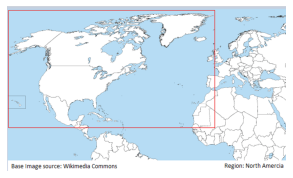

Region: 1 - North America, top_lat: 84, bottom_lat: 14, left_lon: 190, right_lon: 350

Dataset:
---------------
 dimensions:  Frozen({'time': 365, 'lat': 284, 'lon': 644}) 
 coordinates:  Coordinates:
  * time     (time) object 2020-01-01 12:00:00 ... 2020-12-31 12:00:00
  * lat      (lat) float64 14.12 14.38 14.62 14.88 ... 84.12 84.38 84.62 84.88
  * lon      (lon) float64 190.1 190.4 190.6 190.9 ... 350.1 350.4 350.6 350.9 
 variables:  Data variables:
    tasmax           (time, lat, lon) float32 ...
    above_threshold  (time, lat, lon) float32 ...
    extreme_yn       (time, lat, lon) float64 ... 

Grid cells 
---------------
Grid cells for each day are: lat x lon (284 x 644) = 182,896

Note: for cmip 6, the temperature values are provided for only the grid cells covering the land area. 
...temperature values for the grid cells overlapping the sea are nan (not provided).


In [25]:
# user provided parameters:
ext_filename = 'Ext_max_t__Rgn_1__2020__Abv_Avg_4_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245_Avg_yrs_1950_69.nc'
region_id = 1
area_of_interest = None   # provide id,or None

# code starts.
ds_ext = None

reg = Regions()
if area_of_interest is not None:    
    aoi = reg.get_area_of_interest_by_ID(area_of_interest)
    if aoi is not None:
        reg.show_areas_of_interest_by_aoi_ID(area_of_interest, figure_size=5)
        ds_ext = load_1_yr_results_and_basic_analysis(ext_filename, True, aoi)
    else:
        print('Specified area_of_interest ID, {}, does not exist'.format(area_of_interest))
else:
    ds_ext = load_1_yr_results_and_basic_analysis(ext_filename, True)
    reg.show_region_by_ID(ds_ext.attrs['region_id'], figure_size=5)    

print('\nDataset:\n{}\n'.format('-'*15),'dimensions: ', ds_ext.dims, '\n', 'coordinates: ', ds_ext.coords, '\n','variables: ', ds_ext.data_vars, '\n')

lat = ds_ext.dims['lat']
lon = ds_ext.dims['lon']

print('Grid cells \n{}'.format('-'*15))
print('Grid cells for each day are: lat x lon ({} x {}) = {:,d}'.format(lat, lon, (lat*lon)))
if ds_ext.attrs['cmip'] == 6:
    print('\nNote: for cmip 6, the temperature values are provided for only the grid cells covering the land area. \n...temperature values for the grid cells overlapping the sea are nan (not provided).')

## Visualizations

In [26]:
summer_start = '5/1/2020'   # must be mm/dd/yyyy ---- or a datetime, or a cftime.DatetimeNoLeap object
summer_end = '9/30/2020'
summer = datewise_subset(ds_ext, summer_start, summer_end)
summer

<xarray.Dataset>
Dimensions:          (time: 153, lat: 284, lon: 644)
Coordinates:
  * time             (time) object 2020-05-01 12:00:00 ... 2020-09-30 12:00:00
  * lat              (lat) float64 14.12 14.38 14.62 14.88 ... 84.38 84.62 84.88
  * lon              (lon) float64 190.1 190.4 190.6 190.9 ... 350.4 350.6 350.9
Data variables:
    tasmax           (time, lat, lon) float32 ...
    above_threshold  (time, lat, lon) float32 ...
    extreme_yn       (time, lat, lon) float64 ...
Attributes: (12/24)
    Dataset:                                             1-year Extreme max T...
    About dataset:                                       1-year Extreme max T...
    Data variables:                                      tasmax, above_thresh...
    Data description:                                    max temperature; dif...
    Range:                                               1 year
    Analysis year:                                       2020
    ...                                                  ...
    region_bottom_lat:                                   14
    region_left_lon:                                     190
    region_right_lon:                                    350
    region_img_url:                                      https://nasanex30ana...
    Years processed:                                     1
    Store as:                                            Ext_max_t__Rgn_1__20...

#### Interactive visuals: region 1 North America, extreme temperature dataset

In [27]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region(summer, 61, 65, 1, 'tasmax')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-06-30 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_01.png)

In [28]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region(summer, 61, 65, 1, 'above_threshold')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-06-30 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_02.png)

In [29]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region(summer, 61, 65, 1, 'extreme_yn')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-06-30 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_03.png)

In [32]:
one_day = get_results_for_lat_lon(summer, lat=42, lon=246, year=2020, month=6, day=30, also_print=True)

Coordinates:
  * time     (time) object 2020-06-30 12:00:00
  * lat      (lat) float64 42.12
  * lon      (lon) float64 246.1
tasmax
303.6123046875
above_threshold
-0.797699
extreme_yn
0.0


### Get focused results on a subset -- area of interest 107: Northwest US

In [33]:
aoi = reg.get_area_of_interest_by_ID(107)
aoi

{'aoi_id': 107,
 'area_of_interest': 'Northwest US',
 'region_id': 1,
 'region_name': 'North America',
 'top_lat': 49,
 'bottom_lat': 42,
 'left_lon': 235,
 'right_lon': 249,
 'may_to_oct_range': (265, 325),
 'img_url': 'https://nasanex30analysis.blob.core.windows.net/cmip6/images/AoI_Northwest_US.png'}

In [34]:
aoi_107_summer = region_subset(ds_full=summer, top_lat=aoi['top_lat'], bottom_lat=aoi['bottom_lat'], left_lon=aoi['left_lon'], right_lon=aoi['right_lon'])
aoi_107_summer

<xarray.Dataset>
Dimensions:          (time: 153, lat: 32, lon: 60)
Coordinates:
  * time             (time) object 2020-05-01 12:00:00 ... 2020-09-30 12:00:00
  * lat              (lat) float64 42.12 42.38 42.62 42.88 ... 49.38 49.62 49.88
  * lon              (lon) float64 235.1 235.4 235.6 235.9 ... 249.4 249.6 249.9
Data variables:
    tasmax           (time, lat, lon) float32 ...
    above_threshold  (time, lat, lon) float32 ...
    extreme_yn       (time, lat, lon) float64 ...
Attributes: (12/24)
    Dataset:                                             1-year Extreme max T...
    About dataset:                                       1-year Extreme max T...
    Data variables:                                      tasmax, above_thresh...
    Data description:                                    max temperature; dif...
    Range:                                               1 year
    Analysis year:                                       2020
    ...                                                  ...
    region_bottom_lat:                                   14
    region_left_lon:                                     190
    region_right_lon:                                    350
    region_img_url:                                      https://nasanex30ana...
    Years processed:                                     1
    Store as:                                            Ext_max_t__Rgn_1__20...

#### Interactive visual: high, low, average of temperature difference from threshold, by day

In [35]:
%%capture --no-display
#### interactive visual and dataset
ds_threshold_diff, pane = interactive_visual_difference_from_threshold_by_day(aoi_107_summer)
pane

HoloViews(NdOverlay)

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_04.png)

#### Interactive visual: percentage of area with extreme temperature, by day

In [36]:
%%capture --no-display
#### interactive visual and dataset
ds_pct_ext, pane = interactive_visual_pct_pixels_extreme_by_day(aoi_107_summer)
pane

HoloViews(Curve)

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_05.png)

#### Interactive visuals: area of interest 107 Northwest US, extreme temperature dataset

In [37]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region(aoi_107_summer, '2020-07-25', '2020-07-29', 1, 'tasmax')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-07-25 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_06.png)

In [38]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region(aoi_107_summer, '2020-07-25', '2020-07-29', 1, 'above_threshold')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-07-25 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_07.png)

In [39]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region(aoi_107_summer, '2020-07-25', '2020-07-29', 1, 'extreme_yn')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-07-25 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_08.png)

#### Static visuals: area of interest 107 Northwest US, extreme temperature dataset - all three variables, multiple days
All three variables:
* tasmax
* above_threshold (temperature difference in Kelvins, from threshold)
* extreme_yn

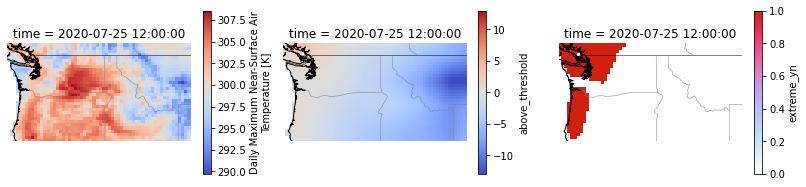

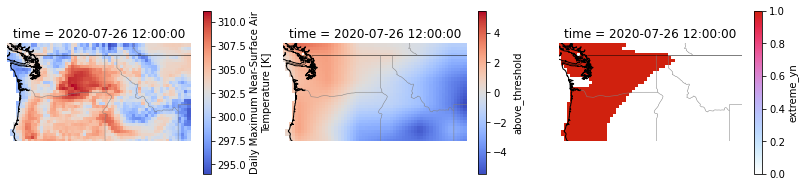

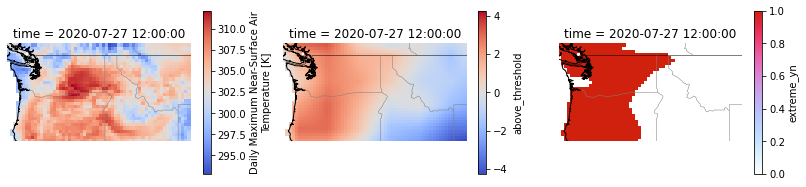

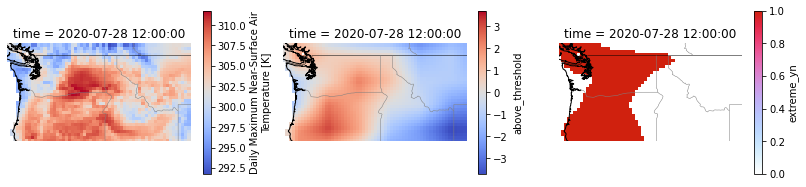

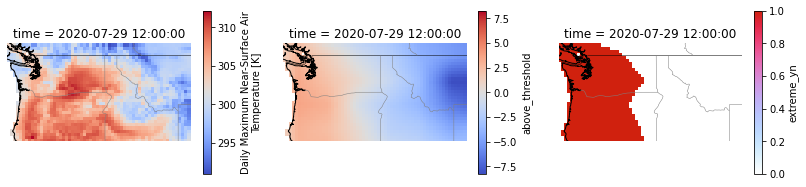

In [40]:
start_day = '2020-07-25'
end_day = '2020-07-29'
step_n_days = 1
static_visual_region(aoi_107_summer, start_day, end_day, step_n_days)

### Create Extreme Temperature data and file -- locally, no azure; maximum temperature (Heat Wave) -- No Averages
NOTE: azure_url_prefix and sas_token are None  
NOTE: based_on_averages is to be False this time  
NOTE: this attempt is for maximum temperature, i.e. for heatwaves, so result_type = 'max'

In [41]:
# analysis_years = range(2020,2025)  # for a range of years
analysis_years = [2020]          # or, for one or more specific years

for analysis_year in analysis_years:
    # filename prefixes, filenames
    name_prefix_1 = 'tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_'               # without the year at the end
    name_prefix_2 = 'tasmax_day_GISS-E2-1-G_ssp245_r1i1p1f2_gn_'                   # without the year at the end (GISS-E2-1-G_ssp245)
    
    if analysis_year < 2015:
        temp_filename = name_prefix_1 + str(analysis_year) + '.nc'                              # historical - with the year and extension
    else:
        temp_filename = name_prefix_2 + str(analysis_year) + '.nc'                              # model ssp245 - with the year and extension

    # url_prefix: remeber to update to tasmax or tasmin; provide without the filename
    cmip_files_url_1 = 'https://data.nas.nasa.gov/viz/vizdata/armichae/gddp/GISS-E2-1-G/historical/r1i1p1f2/tasmax/'
    cmip_files_url_2 = 'https://data.nas.nasa.gov/viz/vizdata/armichae/gddp/GISS-E2-1-G/ssp245/r1i1p1f2/tasmax/'   # GISS-E2-1-G_ssp245

    if analysis_year < 2015:
        cmip_files_url = cmip_files_url_1                              # historical
    else:
        cmip_files_url = cmip_files_url_2                              # model ssp245


#     azure_url_prefix = 'https://nasanex30analysis.blob.core.windows.net/cmip6/extremes_max/GISS_E2_1_G_ssp245/Region_1/Avg_yrs_1950_79/Abv_Avg_5_K_for_3_days'
    azure_url_prefix = None
    sas_token = None

    n_days = 3
    threshold = 305
    avgs_start = None
    avgs_end = None
    model_name='GISS_E2_1_G_ssp245'  # 'historical' / 'GISS_E2_1_G_ssp245' / 'GFDL_ESM4_ssp585' / 'HadGEM3_GC31_LL_ssp245'

    ds_ext, ds_avg_sub = Identify_1_year_Extreme_Temp_By_Region(analysis_year=analysis_year, threshold=threshold, result_type = 'max'
                                , based_on_averages=False, is_percentage=False
                                , n_continuous_days=n_days, cmip=6, model_name=model_name, region_id=1
                                , averages_start_year=avgs_start, averages_end_year=avgs_end
                                , azure_url_extremes=azure_url_prefix, sas_token=sas_token
                                , azure_url_averages=None, azure_url_1_year_temp=None, url_1_year_temp=cmip_files_url
                                                            , temp_filename= temp_filename
                                , remove_source_files=True, area_of_interest=None, name_of_area_of_interest=None
                                , interactive=False, print_extra_msg=False)



Get Extreme maximum temperature identification data
 ... for the year 2020,
 ... for the region 1-North America
 ... for model GISS_E2_1_G_ssp245 of CMIP6
 ... for temperature above 305 Kelvin
 ... when observed for 3 continuous days

18:41:08 UTC: Extreme temperature data filename: Ext_max_t__Rgn_1__2020__Abv_305_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245.nc
18:41:08 UTC: Already available locally? Yes
Complete execution time | Identify_1_year_Extreme_Temp_By_Region | (mins) 0.00


In [42]:
aoi_107 = region_subset(ds_full=ds_ext, top_lat=aoi['top_lat'], bottom_lat=aoi['bottom_lat'], left_lon=aoi['left_lon'], right_lon=aoi['right_lon'])
aoi_107

<xarray.Dataset>
Dimensions:          (time: 365, lat: 32, lon: 60)
Coordinates:
  * time             (time) object 2020-01-01 12:00:00 ... 2020-12-31 12:00:00
  * lat              (lat) float64 42.12 42.38 42.62 42.88 ... 49.38 49.62 49.88
  * lon              (lon) float64 235.1 235.4 235.6 235.9 ... 249.4 249.6 249.9
Data variables:
    tasmax           (time, lat, lon) float32 ...
    above_threshold  (time, lat, lon) float32 ...
    extreme_yn       (time, lat, lon) float64 ...
Attributes: (12/24)
    Dataset:                                             1-year Extreme max T...
    About dataset:                                       1-year Extreme max T...
    Data variables:                                      tasmax, above_thresh...
    Data description:                                    max temperature; dif...
    Range:                                               1 year
    Analysis year:                                       2020
    ...                                                  ...
    region_bottom_lat:                                   14
    region_left_lon:                                     190
    region_right_lon:                                    350
    region_img_url:                                      https://nasanex30ana...
    Years processed:                                     1
    Store as:                                            Ext_max_t__Rgn_1__20...

#### Interactive visual: high, low, average temperature difference from threshold, by day

In [43]:
%%capture --no-display
#### interactive visual and dataset
ds_threshold_diff, pane = interactive_visual_difference_from_threshold_by_day(aoi_107)
pane

HoloViews(NdOverlay)

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_09.png)

#### Interactive visual: percentage of area with extreme temperature, by day

In [44]:
%%capture --no-display
#### interactive visual and dataset
ds_pct_ext, pane = interactive_visual_pct_pixels_extreme_by_day(aoi_107)
pane

HoloViews(Curve)

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_10.png)

#### Interactive visuals: area of interest 107 Northwest US, extreme temperature dataset

In [45]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region(aoi_107, '2020-07-25', '2020-07-29', 1, 'tasmax')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-07-25 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_11.png)

In [46]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region(aoi_107, '2020-07-25', '2020-07-29', 1, 'above_threshold')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-07-25 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_12.png)

In [47]:
%%capture --no-display
#### interactive visual, will take some time to render...
pane = interactive_visual_region(aoi_107, '2020-07-25', '2020-07-29', 1, 'extreme_yn')
pane

Row
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-07-25 ...]), value=cftime.DatetimeNoLeap(2020..., width=250)
        [1] VSpacer()

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_13.png)

#### Static visuals: area of interest 107 Northwest US, extreme temperature dataset - all three variables, multiple days
All three variables:
* tasmax
* above_threshold (temperature difference in Kelvins, from threshold)
* extreme_yn

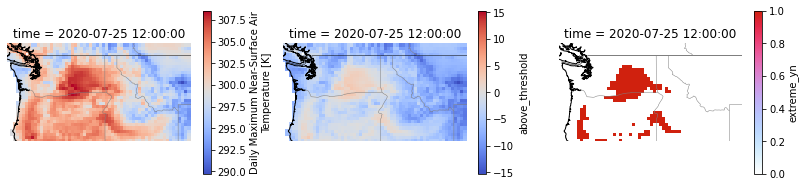

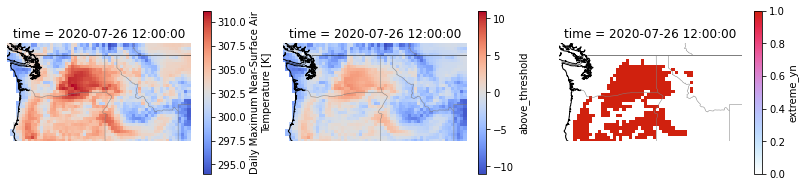

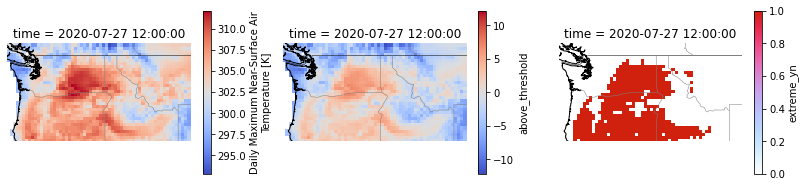

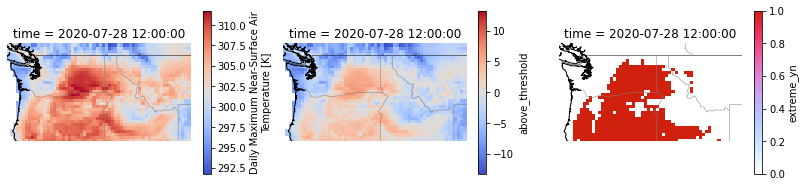

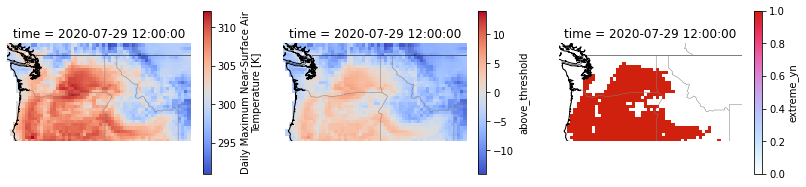

In [48]:
start_day = '2020-07-25'
end_day = '2020-07-29'
step_n_days = 1
static_visual_region(aoi_107, start_day, end_day, step_n_days)

### Create Extreme Temperature data and file -- store in azure; maximum temperature (Heat Wave) -- No Averages
NOTE: azure_url_prefix and sas_token are NOT None  
NOTE: based_on_averages is to be False this time  
NOTE: this attempt is for maximum temperature, i.e. for heatwaves, so result_type = 'max'

In [3]:
import os
# analysis_years = range(2000,2021)  # for a range of years
analysis_years = [2020]          # or, for one or more specific years

# set to True when you need to clear it from local environment after the push to Azure
delete_results_file_after_upload_to_Azure = False  

for analysis_year in analysis_years:
    # filename prefixes, filenames
    name_prefix_1 = 'tasmax_day_GISS-E2-1-G_historical_r1i1p1f2_gn_'               # without the year at the end
    name_prefix_2 = 'tasmax_day_GISS-E2-1-G_ssp245_r1i1p1f2_gn_'                   # without the year at the end (GISS-E2-1-G_ssp245)
    
    if analysis_year < 2015:
        temp_filename = name_prefix_1 + str(analysis_year) + '.nc'                              # historical - with the year and extension
    else:
        temp_filename = name_prefix_2 + str(analysis_year) + '.nc'                              # model ssp245 - with the year and extension

    # url_prefix: remeber to update to tasmax or tasmin; provide without the filename
    cmip_files_url_1 = 'https://ds.nccs.nasa.gov/thredds2/fileServer/AMES/NEX/GDDP-CMIP6/GISS-E2-1-G/historical/r1i1p1f2/tasmax/'
    cmip_files_url_2 = 'https://ds.nccs.nasa.gov/thredds2/fileServer/AMES/NEX/GDDP-CMIP6/GISS-E2-1-G/ssp245/r1i1p1f2/tasmax/'   # GISS-E2-1-G_ssp245

    if analysis_year < 2015:
        cmip_files_url = cmip_files_url_1                              # historical
    else:
        cmip_files_url = cmip_files_url_2                              # model ssp245


    # Azure URL prefix should be the URL till container + /model_name + /Region + /Criteria (see example in the line below)    
    azure_url_prefix = 'https://nasanex30analysis.blob.core.windows.net/cmip6/extremes_max/GISS_E2_1_G_ssp245/Region_1/Abv_305_K_for_3_days'    
    sas_token = 'sp=racwdl&st=2021-12-01T06:20:19Z&se=2021-12-03T02:20:19Z&spr=https&sv=2020-08-04&sr=c&sig=qzWWQJ7eKaFA%2FOQ2bf6xb7fR0upVwL9UvttA4B%2BxOM4%3D'

    n_days = 3
    threshold = 305
    avgs_start = None
    avgs_end = None
    model_name='GISS_E2_1_G_ssp245'  # 'historical' / 'GISS_E2_1_G_ssp245' / 'GFDL_ESM4_ssp585' / 'HadGEM3_GC31_LL_ssp245'

    ds_ext, ds_avg_sub = Identify_1_year_Extreme_Temp_By_Region(analysis_year=analysis_year, threshold=threshold, result_type = 'max'
                                , based_on_averages=False, is_percentage=False
                                , n_continuous_days=n_days, cmip=6, model_name=model_name, region_id=1
                                , averages_start_year=avgs_start, averages_end_year=avgs_end
                                , azure_url_extremes=azure_url_prefix, sas_token=sas_token
                                , azure_url_averages=None, azure_url_1_year_temp=None, url_1_year_temp=cmip_files_url
                                                            , temp_filename= temp_filename
                                , remove_source_files=True, area_of_interest=None, name_of_area_of_interest=None
                                , interactive=False, print_extra_msg=False)

    final_filename='Ext_max_t__Rgn_1__{}__Abv_305_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245.nc'.format(analysis_year)
    if delete_results_file_after_upload_to_Azure:
        os.remove(final_filename)


Get Extreme maximum temperature identification data
 ... for the year 2020,
 ... for the region 1-North America
 ... for model GISS_E2_1_G_ssp245 of CMIP6
 ... for temperature above 305 Kelvin
 ... when observed for 3 continuous days

17:00:20 UTC: Extreme temperature data filename: Ext_max_t__Rgn_1__2020__Abv_305_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245.nc
17:00:20 UTC: Already available locally? No. Checking in Azure...
17:00:21 UTC: Available in Azure, downloading...
17:00:34 UTC: Download complete
17:00:35 UTC: Save back in Azure = True. Upload file if not in Azure already
17:00:35 UTC: File Ext_max_t__Rgn_1__2020__Abv_305_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245.nc is already in Azure. Not uploading again.
Complete execution time | Identify_1_year_Extreme_Temp_By_Region | (mins) 0.24


# Multi-year analyses, Trend Analyses

## Generate Summary Results (once), store locally and upload to Azure 

Results for 70 years -- 2000 to 2069, Northwest US area.  
Also, individual location: Redmond, WA  
Months: June, July, August  
Threshold: Above 305 K

In [3]:
start_year = 2000
end_year = 2069
from_month = 6
to_month = 8
threshold = 305
averages_start_year = None
averages_end_year = None
model_name='GISS_E2_1_G_ssp245'
based_on_averages=False
is_percentage=False
n_continuous_days=3
cmip=6 
region_id=1
aoi_id=107
result_type='max'
locations = {'Redmond':(47.67, -122.16)}
azure_url_source_files = 'https://nasanex30analysis.blob.core.windows.net/cmip6/extremes_max/GISS_E2_1_G_ssp245/Region_1/Abv_305_K_for_3_days'
azure_url_result_files = 'https://nasanex30analysis.blob.core.windows.net/cmip6/extremes_max/GISS_E2_1_G_ssp245/Region_1/Abv_305_K_for_3_days/summary'
sas_token = 'sp=racwdl&st=2021-12-01T06:20:19Z&se=2021-12-03T02:20:19Z&spr=https&sv=2020-08-04&sr=c&sig=qzWWQJ7eKaFA%2FOQ2bf6xb7fR0upVwL9UvttA4B%2BxOM4%3D'

ds_results, ds_locations = extreme_temperature_summary_by_region_and_locations(start_year, end_year, from_month, to_month, region_id
                           , based_on_averages, threshold, is_percentage
                           , n_continuous_days, averages_start_year=averages_start_year, averages_end_year=averages_end_year, cmip=6
                           , result_type='max', model_name=model_name, locations=locations, aoi_id=aoi_id, aoi_in_ext_results=False  
                           , azure_url_source_files=azure_url_source_files, sas_token=sas_token, azure_url_result_files=azure_url_result_files
                           , remove_after_use=True)

validations passed, processing extreme temperature identification files...
process year: 2000 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2001 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2002 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2003 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2004 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2005 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2006 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2007 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2008 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2009 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2010 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2011 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2012 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2013 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2014 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2015 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2016 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2017 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2018 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2019 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2020 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2021 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2022 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2023 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2024 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2025 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2026 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2027 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2028 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2029 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2030 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2031 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2032 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2033 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2034 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2035 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2036 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2037 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2038 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2039 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2040 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2041 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2042 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2043 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2044 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2045 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2046 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2047 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2048 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2049 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2050 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2051 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2052 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2053 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2054 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2055 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2056 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2057 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2058 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2059 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2060 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2061 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2062 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2063 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2064 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2065 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2066 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2067 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2068 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


process year: 2069 ...


/home/jovyan/code/extreme_temp_identification.py:1584: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  dt_index = threshold_diff_high.indexes['time'].to_datetimeindex()


Complete execution time | SaveResult | (mins) 0.00
Complete execution time | SaveResult | (mins) 0.00
Complete execution time | PrepareAverageForRange | (mins) 14.16


### Load back summary results

In [49]:
summary_results_file = 'Summary_2000_2069_Ext_max_t__AoI_107__Abv_305_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245.nc'
ds_results = xr.open_dataset(summary_results_file)
ds_results

<xarray.Dataset>
Dimensions:              (time: 6440)
Coordinates:
  * time                 (time) datetime64[ns] 2000-06-01T12:00:00 ... 2069-0...
Data variables:
    pct_of_area_extreme  (time) float64 ...
    threshold_diff_high  (time) float32 ...
    threshold_diff_low   (time) float32 ...
    threshold_diff_avg   (time) float32 ...
    temp_max             (time) float32 ...
    temp_min             (time) float32 ...
    temp_avg             (time) float32 ...
Attributes: (12/24)
    Dataset:                                             Multi-year Summary o...
    About dataset:                                       Multi-year Summary o...
    Data variables:                                      pct_of_area_extreme,...
    Data description:                                    percentage of area e...
    Range:                                               70 years
    Start year:                                          2000
    ...                                                  ...
    aoi_name:                                            Northwest US
    top_lat:                                             49
    bottom_lat:                                          42
    left_lon:                                            235
    right_lon:                                           249
    img_url:                                             https://nasanex30ana...

In [50]:
Redmond_summary_results_file = 'Redmond_Summary_2000_2069_Ext_max_t__AoI_107__Abv_305_K_for_3_days__CMIP6_GISS_E2_1_G_ssp245.nc'
ds_redmond = xr.open_dataset(Redmond_summary_results_file)
ds_redmond

<xarray.Dataset>
Dimensions:          (time: 6440, lat: 1, lon: 1)
Coordinates:
  * time             (time) object 2000-06-01 12:00:00 ... 2069-08-31 12:00:00
  * lat              (lat) float64 47.62
  * lon              (lon) float64 237.9
Data variables:
    tasmax           (time, lat, lon) float32 ...
    above_threshold  (time, lat, lon) float32 ...
    extreme_yn       (time, lat, lon) float64 ...
Attributes: (12/20)
    Dataset:                                             Multi-year Summary o...
    About dataset:                                       Multi-year Summary o...
    Data variables:                                      tasmax, above_thresh...
    Data description:                                    max temperature; dif...
    location:                                            Redmond
    lat:                                                 47.67
    ...                                                  ...
    result_type:                                         max
    is_percentage:                                       False
    Number of continuous days to be considered extreme:  3
    cmip:                                                6
    model_name:                                          GISS_E2_1_G_ssp245
    Store as:                                            Redmond_Summary_2000...

## Visualize and Analyze Trends: Area 107 Northwest US

In [51]:
# plot variables threshold from threshold (305K) high, average
interactive_visual_line_plot(ds_results, data_variables = ['pct_of_area_extreme'], y_label='pct_of_area_extreme', alpha_value=0.7)

HoloViews(Curve)

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_14.png)

In [52]:
# plot variables threshold_diff_high, threshold_diff_avg
interactive_visual_line_plot(ds_results, data_variables = ['threshold_diff_high','threshold_diff_avg'], y_label='difference from threshold 305K', alpha_value=0.7)

HoloViews(NdOverlay)

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_15.png)

In [53]:
# plot variables temp_max, temp_avg
interactive_visual_line_plot(ds_results, data_variables = ['temp_max','temp_avg'], y_label='Temperature of the Area', alpha_value=0.7)

HoloViews(NdOverlay)

#### For reference: The above code creates a visual like this:
![tasmax by lat lon](./supporting_images/visual_screenshot_16.png)

## Visualize and Analyze Trends: Area 107 Northwest US --- specific location: Redmond (46.67, -122.16)

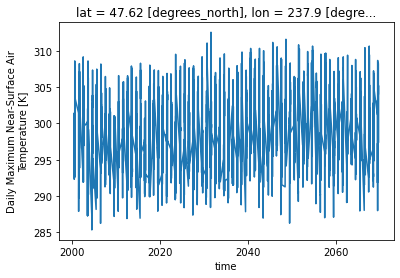

In [21]:
ds_redmond.tasmax.plot()

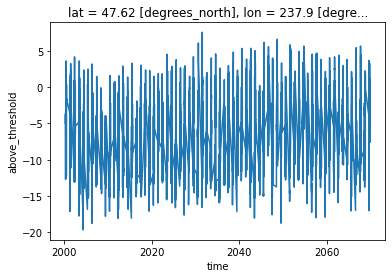

In [22]:
ds_redmond.above_threshold.plot()

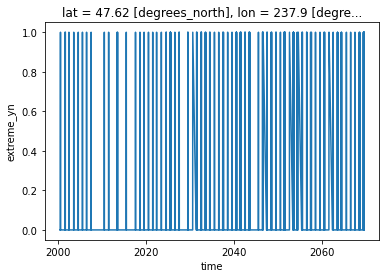

In [24]:
ds_redmond.extreme_yn.plot()